In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import datetime
from datetime import date, timedelta
import datetime
import matplotlib.dates as mdates
%matplotlib inline
import pickle

In [2]:
df_covid_hospital = pd.read_csv('https://healthdata.gov/api/views/anag-cw7u/rows.csv?accessType=DOWNLOAD', parse_dates = ['collection_week'])

<ipython-input-2-e9be264edbd9>:1: DtypeWarning: Columns (10,65,108) have mixed types. Specify dtype option on import or set low_memory=False.
  df_covid_hospital = pd.read_csv('https://healthdata.gov/api/views/anag-cw7u/rows.csv?accessType=DOWNLOAD', parse_dates = ['collection_week'])


In [3]:
df_covid_hospital.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 308977 entries, 0 to 308976
Columns: 128 entries, hospital_pk to total_staffed_pediatric_icu_beds_7_day_sum
dtypes: datetime64[ns](1), float64(115), object(12)
memory usage: 301.7+ MB


https://healthdata.gov/Hospital/COVID-19-Reported-Patient-Impact-and-Hospital-Capa/anag-cw7u

In [4]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [5]:
df_covid_hospital.max()

<ipython-input-5-01f637ca874f>:1: FutureWarning: The default value of numeric_only in DataFrame.max is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_covid_hospital.max()


hospital_pk                                                                                             }
collection_week                                                                       2022-12-16 00:00:00
zip                                                                                               99901.0
fips_code                                                                                         78020.0
is_metro_micro                                                                                       True
total_beds_7_day_avg                                                                               6542.0
all_adult_hospital_beds_7_day_avg                                                                  3881.0
all_adult_hospital_inpatient_beds_7_day_avg                                                        2865.1
inpatient_beds_used_7_day_avg                                                                      2897.0
all_adult_hospital_inpatient_bed_occupied_7_da

In [6]:
df_covid_hospital.tail(10)

,hospital_pk,collection_week,state,ccn,hospital_name,address,city,zip,hospital_subtype,fips_code,is_metro_micro,total_beds_7_day_avg,all_adult_hospital_beds_7_day_avg,all_adult_hospital_inpatient_beds_7_day_avg,inpatient_beds_used_7_day_avg,all_adult_hospital_inpatient_bed_occupied_7_day_avg,inpatient_beds_used_covid_7_day_avg,total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg,total_adult_patients_hospitalized_confirmed_covid_7_day_avg,total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg,total_pediatric_patients_hospitalized_confirmed_covid_7_day_avg,inpatient_beds_7_day_avg,total_icu_beds_7_day_avg,total_staffed_adult_icu_beds_7_day_avg,icu_beds_used_7_day_avg,staffed_adult_icu_bed_occupancy_7_day_avg,staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_avg,staffed_icu_adult_patients_confirmed_covid_7_day_avg,total_patients_hospitalized_confirmed_influenza_7_day_avg,icu_patients_confirmed_influenza_7_day_avg,total_patients_hospitalized_confirmed_influenza_and_covid_7_day_avg,total_beds_7_day_sum,all_adult_hospital_beds_7_day_sum,all_adult_hospital_inpatient_beds_7_day_sum,inpatient_beds_used_7_day_sum,all_adult_hospital_inpatient_bed_occupied_7_day_sum,inpatient_beds_used_covid_7_day_sum,total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_sum,total_adult_patients_hospitalized_confirmed_covid_7_day_sum,total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_sum,total_pediatric_patients_hospitalized_confirmed_covid_7_day_sum,inpatient_beds_7_day_sum,total_icu_beds_7_day_sum,total_staffed_adult_icu_beds_7_day_sum,icu_beds_used_7_day_sum,staffed_adult_icu_bed_occupancy_7_day_sum,staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_sum,staffed_icu_adult_patients_confirmed_covid_7_day_sum,total_patients_hospitalized_confirmed_influenza_7_day_sum,icu_patients_confirmed_influenza_7_day_sum,total_patients_hospitalized_confirmed_influenza_and_covid_7_day_sum,total_beds_7_day_coverage,all_adult_hospital_beds_7_day_coverage,all_adult_hospital_inpatient_beds_7_day_coverage,inpatient_beds_used_7_day_coverage,all_adult_hospital_inpatient_bed_occupied_7_day_coverage,inpatient_beds_used_covid_7_day_coverage,total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_coverage,total_adult_patients_hospitalized_confirmed_covid_7_day_coverage,total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_coverage,total_pediatric_patients_hospitalized_confirmed_covid_7_day_coverage,inpatient_beds_7_day_coverage,total_icu_beds_7_day_coverage,total_staffed_adult_icu_beds_7_day_coverage,icu_beds_used_7_day_coverage,staffed_adult_icu_bed_occupancy_7_day_coverage,staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_coverage,staffed_icu_adult_patients_confirmed_covid_7_day_coverage,total_patients_hospitalized_confirmed_influenza_7_day_coverage,icu_patients_confirmed_influenza_7_day_coverage,total_patients_hospitalized_confirmed_influenza_and_covid_7_day_coverage,previous_day_admission_adult_covid_confirmed_7_day_sum,previous_day_admission_adult_covid_confirmed_18-19_7_day_sum,previous_day_admission_adult_covid_confirmed_20-29_7_day_sum,previous_day_admission_adult_covid_confirmed_30-39_7_day_sum,previous_day_admission_adult_covid_confirmed_40-49_7_day_sum,previous_day_admission_adult_covid_confirmed_50-59_7_day_sum,previous_day_admission_adult_covid_confirmed_60-69_7_day_sum,previous_day_admission_adult_covid_confirmed_70-79_7_day_sum,previous_day_admission_adult_covid_confirmed_80+_7_day_sum,previous_day_admission_adult_covid_confirmed_unknown_7_day_sum,previous_day_admission_pediatric_covid_confirmed_7_day_sum,previous_day_covid_ED_visits_7_day_sum,previous_day_admission_adult_covid_suspected_7_day_sum,previous_day_admission_adult_covid_suspected_18-19_7_day_sum,previous_day_admission_adult_covid_suspected_20-29_7_day_sum,previous_day_admission_adult_covid_suspected_30-39_7_day_sum,previous_day_admission_adult_covid_su

In [7]:
df_covid_hospital.shape

(308977, 128)

In [8]:
df_covid_hospital.sort_values(by ='collection_week', ascending = False).head()

,hospital_pk,collection_week,state,ccn,hospital_name,address,city,zip,hospital_subtype,fips_code,is_metro_micro,total_beds_7_day_avg,all_adult_hospital_beds_7_day_avg,all_adult_hospital_inpatient_beds_7_day_avg,inpatient_beds_used_7_day_avg,all_adult_hospital_inpatient_bed_occupied_7_day_avg,inpatient_beds_used_covid_7_day_avg,total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg,total_adult_patients_hospitalized_confirmed_covid_7_day_avg,total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg,total_pediatric_patients_hospitalized_confirmed_covid_7_day_avg,inpatient_beds_7_day_avg,total_icu_beds_7_day_avg,total_staffed_adult_icu_beds_7_day_avg,icu_beds_used_7_day_avg,staffed_adult_icu_bed_occupancy_7_day_avg,staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_avg,staffed_icu_adult_patients_confirmed_covid_7_day_avg,total_patients_hospitalized_confirmed_influenza_7_day_avg,icu_patients_confirmed_influenza_7_day_avg,total_patients_hospitalized_confirmed_influenza_and_covid_7_day_avg,total_beds_7_day_sum,all_adult_hospital_beds_7_day_sum,all_adult_hospital_inpatient_beds_7_day_sum,inpatient_beds_used_7_day_sum,all_adult_hospital_inpatient_bed_occupied_7_day_sum,inpatient_beds_used_covid_7_day_sum,total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_sum,total_adult_patients_hospitalized_confirmed_covid_7_day_sum,total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_sum,total_pediatric_patients_hospitalized_confirmed_covid_7_day_sum,inpatient_beds_7_day_sum,total_icu_beds_7_day_sum,total_staffed_adult_icu_beds_7_day_sum,icu_beds_used_7_day_sum,staffed_adult_icu_bed_occupancy_7_day_sum,staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_sum,staffed_icu_adult_patients_confirmed_covid_7_day_sum,total_patients_hospitalized_confirmed_influenza_7_day_sum,icu_patients_confirmed_influenza_7_day_sum,total_patients_hospitalized_confirmed_influenza_and_covid_7_day_sum,total_beds_7_day_coverage,all_adult_hospital_beds_7_day_coverage,all_adult_hospital_inpatient_beds_7_day_coverage,inpatient_beds_used_7_day_coverage,all_adult_hospital_inpatient_bed_occupied_7_day_coverage,inpatient_beds_used_covid_7_day_coverage,total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_coverage,total_adult_patients_hospitalized_confirmed_covid_7_day_coverage,total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_coverage,total_pediatric_patients_hospitalized_confirmed_covid_7_day_coverage,inpatient_beds_7_day_coverage,total_icu_beds_7_day_coverage,total_staffed_adult_icu_beds_7_day_coverage,icu_beds_used_7_day_coverage,staffed_adult_icu_bed_occupancy_7_day_coverage,staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_coverage,staffed_icu_adult_patients_confirmed_covid_7_day_coverage,total_patients_hospitalized_confirmed_influenza_7_day_coverage,icu_patients_confirmed_influenza_7_day_coverage,total_patients_hospitalized_confirmed_influenza_and_covid_7_day_coverage,previous_day_admission_adult_covid_confirmed_7_day_sum,previous_day_admission_adult_covid_confirmed_18-19_7_day_sum,previous_day_admission_adult_covid_confirmed_20-29_7_day_sum,previous_day_admission_adult_covid_confirmed_30-39_7_day_sum,previous_day_admission_adult_covid_confirmed_40-49_7_day_sum,previous_day_admission_adult_covid_confirmed_50-59_7_day_sum,previous_day_admission_adult_covid_confirmed_60-69_7_day_sum,previous_day_admission_adult_covid_confirmed_70-79_7_day_sum,previous_day_admission_adult_covid_confirmed_80+_7_day_sum,previous_day_admission_adult_covid_confirmed_unknown_7_day_sum,previous_day_admission_pediatric_covid_confirmed_7_day_sum,previous_day_covid_ED_visits_7_day_sum,previous_day_admission_adult_covid_suspected_7_day_sum,previous_day_admission_adult_covid_suspected_18-19_7_day_sum,previous_day_admission_adult_covid_suspected_20-29_7_day_sum,previous_day_admission_adult_covid_suspected_30-39_7_day_sum,previous_day_admission_adult_covid_su

In [9]:
type(df_covid_hospital.collection_week)

pandas.core.series.Series

In [10]:
for x in df_covid_hospital.columns:
    print(x)

hospital_pk
collection_week
state
ccn
hospital_name
address
city
zip
hospital_subtype
fips_code
is_metro_micro
total_beds_7_day_avg
all_adult_hospital_beds_7_day_avg
all_adult_hospital_inpatient_beds_7_day_avg
inpatient_beds_used_7_day_avg
all_adult_hospital_inpatient_bed_occupied_7_day_avg
inpatient_beds_used_covid_7_day_avg
total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg
total_adult_patients_hospitalized_confirmed_covid_7_day_avg
total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg
total_pediatric_patients_hospitalized_confirmed_covid_7_day_avg
inpatient_beds_7_day_avg
total_icu_beds_7_day_avg
total_staffed_adult_icu_beds_7_day_avg
icu_beds_used_7_day_avg
staffed_adult_icu_bed_occupancy_7_day_avg
staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_avg
staffed_icu_adult_patients_confirmed_covid_7_day_avg
total_patients_hospitalized_confirmed_influenza_7_day_avg
icu_patients_confirmed_influenza_7_day_avg
total_patients_hospi

In [11]:
df_covid_hospital.dtypes.value_counts()

float64           115
object             12
datetime64[ns]      1
dtype: int64

In [12]:
df_covid_hospital.index

RangeIndex(start=0, stop=308977, step=1)

In [13]:
df_covid_hospital.ndim

2

In [14]:
df_covid_hospital.size

39549056

In [15]:
df_covid_hospital.count()

hospital_pk                                                                           308977
collection_week                                                                       308973
state                                                                                 308973
ccn                                                                                   308359
hospital_name                                                                         308973
address                                                                               308789
city                                                                                  308789
zip                                                                                   308963
hospital_subtype                                                                      308973
fips_code                                                                             308580
is_metro_micro                                                        

In [16]:
df_covid_hospital.nunique()

hospital_pk                                                                           5134
collection_week                                                                        156
state                                                                                   56
ccn                                                                                   5093
hospital_name                                                                         4985
address                                                                               5058
city                                                                                  2961
zip                                                                                   4487
hospital_subtype                                                                         4
fips_code                                                                             2478
is_metro_micro                                                                           2

In [17]:
df_covid_hospital.max()

<ipython-input-17-01f637ca874f>:1: FutureWarning: The default value of numeric_only in DataFrame.max is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_covid_hospital.max()


hospital_pk                                                                                             }
collection_week                                                                       2022-12-16 00:00:00
zip                                                                                               99901.0
fips_code                                                                                         78020.0
is_metro_micro                                                                                       True
total_beds_7_day_avg                                                                               6542.0
all_adult_hospital_beds_7_day_avg                                                                  3881.0
all_adult_hospital_inpatient_beds_7_day_avg                                                        2865.1
inpatient_beds_used_7_day_avg                                                                      2897.0
all_adult_hospital_inpatient_bed_occupied_7_da

In [18]:
df_covid_hospital[df_covid_hospital.city == 'SAN ANTONIO'].max()

<ipython-input-18-cd4508039ae0>:1: FutureWarning: The default value of numeric_only in DataFrame.max is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_covid_hospital[df_covid_hospital.city == 'SAN ANTONIO'].max()


hospital_pk                                                                                               670125
collection_week                                                                              2022-12-16 00:00:00
state                                                                                                         TX
ccn                                                                                                       670125
hospital_name                                                                           UNIVERSITY HEALTH SYSTEM
address                                                                                        9522 HUEBNER ROAD
city                                                                                                 SAN ANTONIO
zip                                                                                                      78258.0
hospital_subtype                                                                                

In [19]:
df_covid_hospital[(df_covid_hospital.city == 'SAN ANTONIO') & (df_covid_hospital.collection_week == '2022-01-07')][['hospital_pk','hospital_name','address','previous_day_admission_pediatric_covid_confirmed_7_day_sum']]

,hospital_pk,hospital_name,address,previous_day_admission_pediatric_covid_confirmed_7_day_sum
97340,670125,TEXAS CENTER FOR INFECTIOUS DISEASE,2303 SE MILITARY DR P O BOX 23340,0.0
116217,450237,CHRISTUS SANTA ROSA MEDICAL CENTER,2827 BABCOCK ROAD,0.0
158895,670055,METHODIST HOSPITAL STONE OAK,"1139 E SONTERRA BLVD,",0.0
251323,450856,SOUTH TEXAS SPINE AND SURGICAL HOSPITAL,18600 NORTH HARDY OAK BLVD,0.0


In [20]:
df_covid_hospital.collection_week.unique().max()

numpy.datetime64('NaT')

In [21]:
df_covid_hospital[(df_covid_hospital.city == 'SAN ANTONIO') & (df_covid_hospital.collection_week == '2022-01-07')][['hospital_name','previous_day_admission_adult_covid_confirmed_7_day_sum']]

,hospital_name,previous_day_admission_adult_covid_confirmed_7_day_sum
97340,TEXAS CENTER FOR INFECTIOUS DISEASE,0.0
116217,CHRISTUS SANTA ROSA MEDICAL CENTER,109.0
158895,METHODIST HOSPITAL STONE OAK,28.0
251323,SOUTH TEXAS SPINE AND SURGICAL HOSPITAL,0.0


In [22]:
df_covid_hospital[(df_covid_hospital.city == 'SAN ANTONIO') & (df_covid_hospital.collection_week == '2021-12-10')][['previous_day_admission_adult_covid_confirmed_7_day_sum']]

,previous_day_admission_adult_covid_confirmed_7_day_sum
52260,0.0
99384,0.0
113841,-999999.0
135584,0.0
151214,0.0
151427,9.0
214716,0.0
218143,46.0
240801,0.0


In [23]:
aaa = list(df_covid_hospital.collection_week.unique())

In [24]:
aaa

[numpy.datetime64('2020-04-17T00:00:00.000000000'),
 numpy.datetime64('2020-05-22T00:00:00.000000000'),
 numpy.datetime64('2020-05-15T00:00:00.000000000'),
 numpy.datetime64('2020-05-08T00:00:00.000000000'),
 numpy.datetime64('2020-07-03T00:00:00.000000000'),
 numpy.datetime64('2020-06-12T00:00:00.000000000'),
 numpy.datetime64('2020-05-01T00:00:00.000000000'),
 numpy.datetime64('2020-06-26T00:00:00.000000000'),
 numpy.datetime64('2020-03-13T00:00:00.000000000'),
 numpy.datetime64('2020-08-21T00:00:00.000000000'),
 numpy.datetime64('2020-03-06T00:00:00.000000000'),
 numpy.datetime64('2020-04-10T00:00:00.000000000'),
 numpy.datetime64('2020-05-29T00:00:00.000000000'),
 numpy.datetime64('2020-03-27T00:00:00.000000000'),
 numpy.datetime64('2020-04-24T00:00:00.000000000'),
 numpy.datetime64('2020-06-05T00:00:00.000000000'),
 numpy.datetime64('2020-06-19T00:00:00.000000000'),
 numpy.datetime64('2020-07-17T00:00:00.000000000'),
 numpy.datetime64('2020-04-03T00:00:00.000000000'),
 numpy.datet

In [25]:
aaa.sort()

In [26]:
aaa

[numpy.datetime64('2019-12-27T00:00:00.000000000'),
 numpy.datetime64('2020-01-03T00:00:00.000000000'),
 numpy.datetime64('2020-01-10T00:00:00.000000000'),
 numpy.datetime64('2020-01-17T00:00:00.000000000'),
 numpy.datetime64('2020-01-24T00:00:00.000000000'),
 numpy.datetime64('2020-01-31T00:00:00.000000000'),
 numpy.datetime64('2020-02-07T00:00:00.000000000'),
 numpy.datetime64('2020-02-14T00:00:00.000000000'),
 numpy.datetime64('2020-02-21T00:00:00.000000000'),
 numpy.datetime64('2020-02-28T00:00:00.000000000'),
 numpy.datetime64('2020-03-06T00:00:00.000000000'),
 numpy.datetime64('2020-03-13T00:00:00.000000000'),
 numpy.datetime64('2020-03-20T00:00:00.000000000'),
 numpy.datetime64('2020-03-27T00:00:00.000000000'),
 numpy.datetime64('2020-04-03T00:00:00.000000000'),
 numpy.datetime64('2020-04-10T00:00:00.000000000'),
 numpy.datetime64('2020-04-17T00:00:00.000000000'),
 numpy.datetime64('2020-04-24T00:00:00.000000000'),
 numpy.datetime64('2020-05-01T00:00:00.000000000'),
 numpy.datet

In [27]:
aaa = df_covid_hospital[df_covid_hospital.hospital_pk == '450388'][['collection_week','hospital_name','previous_day_admission_pediatric_covid_confirmed_7_day_sum']]
 

In [28]:
bbb = aaa.sort_values(by = 'collection_week')

In [29]:
ccc = bbb.set_index('collection_week')


In [30]:
ddd = ccc[ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0][['previous_day_admission_pediatric_covid_confirmed_7_day_sum']]

In [31]:
ccc

,hospital_name,previous_day_admission_pediatric_covid_confirmed_7_day_sum
collection_week,,
2020-04-10,METHODIST HOSPITAL,NaN
2020-05-15,METHODIST HOSPITAL,NaN
2020-05-29,METHODIST HOSPITAL,NaN
2020-06-05,METHODIST HOSPITAL,NaN
2020-06-26,METHODIST HOSPITAL,NaN
2020-07-03,METHODIST HOSPITAL,NaN
2020-07-10,METHODIST HOSPITAL,-999999.0
2020-07-24,METHODIST HOSPITAL,5.0
2020-08-07,METHODIST HOSPITAL,-999999.0


In [32]:
ddd_rolling = ddd.rolling(7).mean().shift()

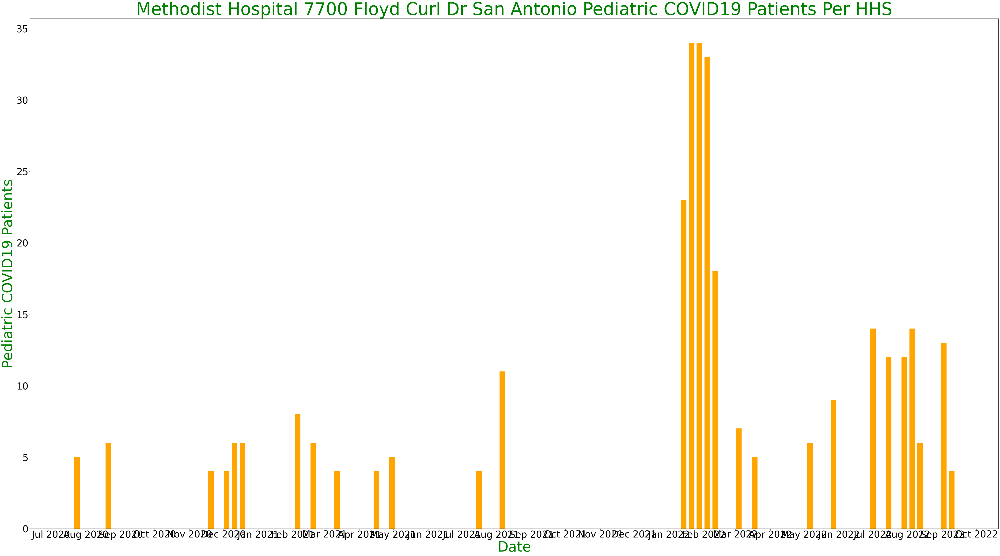

In [33]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Methodist Hospital 7700 Floyd Curl Dr San Antonio Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(ddd.index, ddd.previous_day_admission_pediatric_covid_confirmed_7_day_sum, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_Methodist_Pediatric.png')

In [34]:
aaa = df_covid_hospital[df_covid_hospital.hospital_pk == '453315'][['collection_week','hospital_name','previous_day_admission_pediatric_covid_confirmed_7_day_sum']]

In [35]:
bbb = aaa.sort_values(by = 'collection_week')

In [36]:
ccc = bbb.set_index('collection_week')

In [37]:
ddd = ccc[ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0][['previous_day_admission_pediatric_covid_confirmed_7_day_sum']]

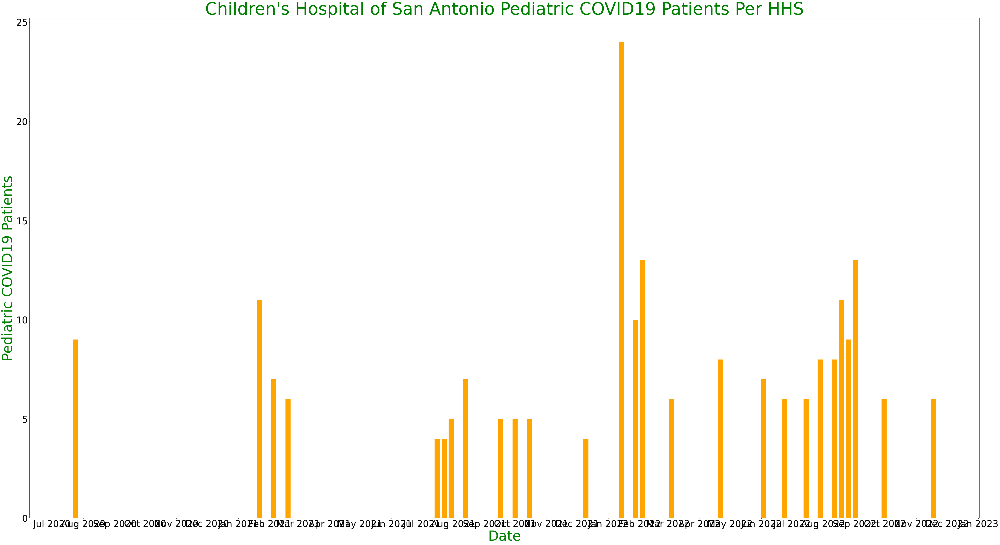

In [38]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Children\'s Hospital of San Antonio Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(ddd.index, ddd.previous_day_admission_pediatric_covid_confirmed_7_day_sum, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_Childrens_Pediatric.png')

In [39]:
aaa = df_covid_hospital[df_covid_hospital.hospital_pk == '450213'][['collection_week','hospital_name','address','previous_day_admission_pediatric_covid_confirmed_7_day_sum']]

In [40]:
aaa

,collection_week,hospital_name,address,previous_day_admission_pediatric_covid_confirmed_7_day_sum
22123,2021-09-03,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,5.0
23862,2022-08-19,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,-999999.0
27422,2022-09-23,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,4.0
27818,2021-04-09,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,-999999.0
40222,2020-06-19,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,NaN
44008,2020-11-20,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,-999999.0
44536,2022-04-01,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,0.0
46294,2022-04-15,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,0.0
46394,2021-04-16,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,-999999.0
59369,2021-10-08,UNIVERSITY HEALTH SYSTEM,4502 MEDICAL DR,-999999.0


In [41]:
bbb = aaa.sort_values(by = 'collection_week')
ccc = bbb.set_index('collection_week')
ddd = ccc[ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0][['previous_day_admission_pediatric_covid_confirmed_7_day_sum']]

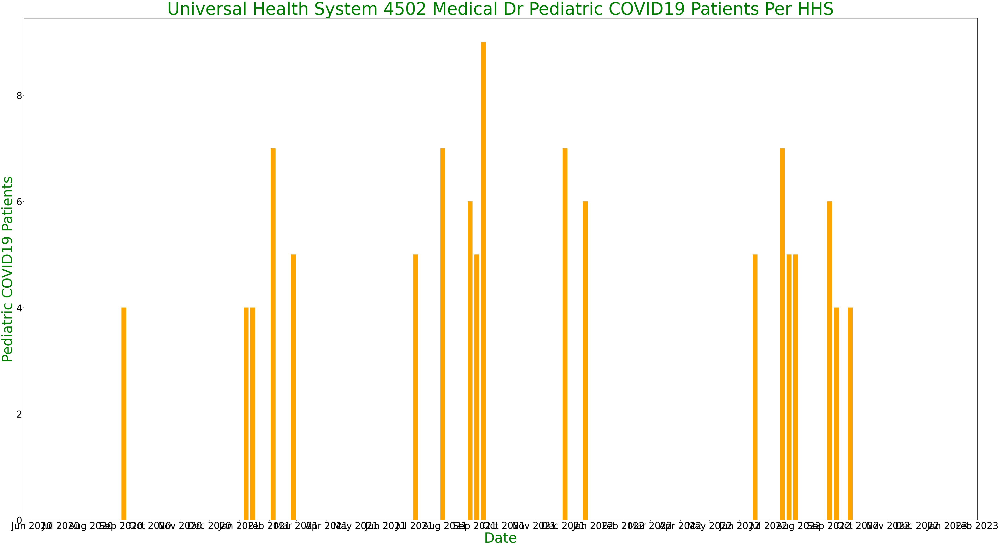

In [42]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Universal Health System 4502 Medical Dr Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(ddd.index, ddd.previous_day_admission_pediatric_covid_confirmed_7_day_sum, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_Universal_Pediatric.png')

In [43]:
aaa = df_covid_hospital[df_covid_hospital.hospital_pk == '450058'][['collection_week','hospital_name','address','previous_day_admission_pediatric_covid_confirmed_7_day_sum']]

In [44]:
aaa

,collection_week,hospital_name,address,previous_day_admission_pediatric_covid_confirmed_7_day_sum
6143,2020-05-29,BAPTIST MEDICAL CENTER,111 DALLAS STREET,NaN
8008,2020-06-26,BAPTIST MEDICAL CENTER,111 DALLAS STREET,NaN
19625,2020-05-15,BAPTIST MEDICAL CENTER,111 DALLAS STREET,NaN
22552,2022-08-12,BAPTIST MEDICAL CENTER,111 DALLAS STREET,-999999.0
23044,2020-09-04,BAPTIST MEDICAL CENTER,111 DALLAS STREET,0.0
39860,2022-06-03,BAPTIST MEDICAL CENTER,111 DALLAS STREET,-999999.0
41543,2021-06-11,BAPTIST MEDICAL CENTER,111 DALLAS STREET,0.0
44477,2021-05-14,BAPTIST MEDICAL CENTER,111 DALLAS STREET,0.0
44602,2021-05-28,BAPTIST MEDICAL CENTER,111 DALLAS STREET,0.0
46904,2020-05-08,BAPTIST MEDICAL CENTER,111 DALLAS STREET,NaN


In [45]:
bbb = aaa.sort_values(by = 'collection_week')
ccc = bbb.set_index('collection_week')
ddd = ccc[ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0][['previous_day_admission_pediatric_covid_confirmed_7_day_sum']]

In [46]:
ddd

,previous_day_admission_pediatric_covid_confirmed_7_day_sum
collection_week,
2020-08-14,0.0
2020-08-21,0.0
2020-08-28,0.0
2020-09-04,0.0
2020-09-11,0.0
2020-10-16,0.0
2020-10-23,0.0
2021-01-01,0.0
2021-01-15,0.0


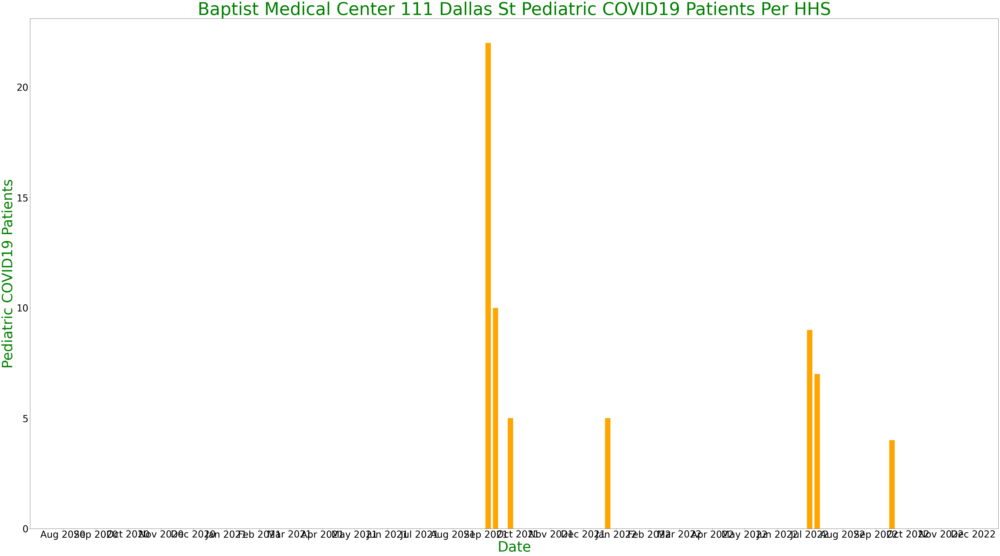

In [47]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Baptist Medical Center 111 Dallas St Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(ddd.index, ddd.previous_day_admission_pediatric_covid_confirmed_7_day_sum, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_Baptist_Pediatric.png')

In [48]:
aaa = df_covid_hospital[(df_covid_hospital.city == 'SAN ANTONIO') & (df_covid_hospital.collection_week == '2022-01-07')][['hospital_pk','hospital_name','address','previous_day_admission_pediatric_covid_confirmed_7_day_sum']]

In [49]:
bbb = aaa[aaa.previous_day_admission_pediatric_covid_confirmed_7_day_sum >=0]

In [50]:
aaa

,hospital_pk,hospital_name,address,previous_day_admission_pediatric_covid_confirmed_7_day_sum
97340,670125,TEXAS CENTER FOR INFECTIOUS DISEASE,2303 SE MILITARY DR P O BOX 23340,0.0
116217,450237,CHRISTUS SANTA ROSA MEDICAL CENTER,2827 BABCOCK ROAD,0.0
158895,670055,METHODIST HOSPITAL STONE OAK,"1139 E SONTERRA BLVD,",0.0
251323,450856,SOUTH TEXAS SPINE AND SURGICAL HOSPITAL,18600 NORTH HARDY OAK BLVD,0.0


In [51]:
bbb

,hospital_pk,hospital_name,address,previous_day_admission_pediatric_covid_confirmed_7_day_sum
97340,670125,TEXAS CENTER FOR INFECTIOUS DISEASE,2303 SE MILITARY DR P O BOX 23340,0.0
116217,450237,CHRISTUS SANTA ROSA MEDICAL CENTER,2827 BABCOCK ROAD,0.0
158895,670055,METHODIST HOSPITAL STONE OAK,"1139 E SONTERRA BLVD,",0.0
251323,450856,SOUTH TEXAS SPINE AND SURGICAL HOSPITAL,18600 NORTH HARDY OAK BLVD,0.0


In [52]:
aaa = df_covid_hospital[df_covid_hospital.city == 'SAN ANTONIO']

In [53]:
aaa

,hospital_pk,collection_week,state,ccn,hospital_name,address,city,zip,hospital_subtype,fips_code,is_metro_micro,total_beds_7_day_avg,all_adult_hospital_beds_7_day_avg,all_adult_hospital_inpatient_beds_7_day_avg,inpatient_beds_used_7_day_avg,all_adult_hospital_inpatient_bed_occupied_7_day_avg,inpatient_beds_used_covid_7_day_avg,total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg,total_adult_patients_hospitalized_confirmed_covid_7_day_avg,total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg,total_pediatric_patients_hospitalized_confirmed_covid_7_day_avg,inpatient_beds_7_day_avg,total_icu_beds_7_day_avg,total_staffed_adult_icu_beds_7_day_avg,icu_beds_used_7_day_avg,staffed_adult_icu_bed_occupancy_7_day_avg,staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_avg,staffed_icu_adult_patients_confirmed_covid_7_day_avg,total_patients_hospitalized_confirmed_influenza_7_day_avg,icu_patients_confirmed_influenza_7_day_avg,total_patients_hospitalized_confirmed_influenza_and_covid_7_day_avg,total_beds_7_day_sum,all_adult_hospital_beds_7_day_sum,all_adult_hospital_inpatient_beds_7_day_sum,inpatient_beds_used_7_day_sum,all_adult_hospital_inpatient_bed_occupied_7_day_sum,inpatient_beds_used_covid_7_day_sum,total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_sum,total_adult_patients_hospitalized_confirmed_covid_7_day_sum,total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_sum,total_pediatric_patients_hospitalized_confirmed_covid_7_day_sum,inpatient_beds_7_day_sum,total_icu_beds_7_day_sum,total_staffed_adult_icu_beds_7_day_sum,icu_beds_used_7_day_sum,staffed_adult_icu_bed_occupancy_7_day_sum,staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_sum,staffed_icu_adult_patients_confirmed_covid_7_day_sum,total_patients_hospitalized_confirmed_influenza_7_day_sum,icu_patients_confirmed_influenza_7_day_sum,total_patients_hospitalized_confirmed_influenza_and_covid_7_day_sum,total_beds_7_day_coverage,all_adult_hospital_beds_7_day_coverage,all_adult_hospital_inpatient_beds_7_day_coverage,inpatient_beds_used_7_day_coverage,all_adult_hospital_inpatient_bed_occupied_7_day_coverage,inpatient_beds_used_covid_7_day_coverage,total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_coverage,total_adult_patients_hospitalized_confirmed_covid_7_day_coverage,total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_coverage,total_pediatric_patients_hospitalized_confirmed_covid_7_day_coverage,inpatient_beds_7_day_coverage,total_icu_beds_7_day_coverage,total_staffed_adult_icu_beds_7_day_coverage,icu_beds_used_7_day_coverage,staffed_adult_icu_bed_occupancy_7_day_coverage,staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_coverage,staffed_icu_adult_patients_confirmed_covid_7_day_coverage,total_patients_hospitalized_confirmed_influenza_7_day_coverage,icu_patients_confirmed_influenza_7_day_coverage,total_patients_hospitalized_confirmed_influenza_and_covid_7_day_coverage,previous_day_admission_adult_covid_confirmed_7_day_sum,previous_day_admission_adult_covid_confirmed_18-19_7_day_sum,previous_day_admission_adult_covid_confirmed_20-29_7_day_sum,previous_day_admission_adult_covid_confirmed_30-39_7_day_sum,previous_day_admission_adult_covid_confirmed_40-49_7_day_sum,previous_day_admission_adult_covid_confirmed_50-59_7_day_sum,previous_day_admission_adult_covid_confirmed_60-69_7_day_sum,previous_day_admission_adult_covid_confirmed_70-79_7_day_sum,previous_day_admission_adult_covid_confirmed_80+_7_day_sum,previous_day_admission_adult_covid_confirmed_unknown_7_day_sum,previous_day_admission_pediatric_covid_confirmed_7_day_sum,previous_day_covid_ED_visits_7_day_sum,previous_day_admission_adult_covid_suspected_7_day_sum,previous_day_admission_adult_covid_suspected_18-19_7_day_sum,previous_day_admission_adult_covid_suspected_20-29_7_day_sum,previous_day_admission_adult_covid_suspected_30-39_7_day_sum,previous_day_admission_adult_covid_su

In [54]:
date_list = aaa.collection_week.unique()

In [55]:
date_list.sort()

In [56]:
date_list

array(['2020-03-27T00:00:00.000000000', '2020-04-03T00:00:00.000000000',
       '2020-04-10T00:00:00.000000000', '2020-04-17T00:00:00.000000000',
       '2020-04-24T00:00:00.000000000', '2020-05-01T00:00:00.000000000',
       '2020-05-08T00:00:00.000000000', '2020-05-15T00:00:00.000000000',
       '2020-05-22T00:00:00.000000000', '2020-05-29T00:00:00.000000000',
       '2020-06-05T00:00:00.000000000', '2020-06-12T00:00:00.000000000',
       '2020-06-19T00:00:00.000000000', '2020-06-26T00:00:00.000000000',
       '2020-07-03T00:00:00.000000000', '2020-07-10T00:00:00.000000000',
       '2020-07-17T00:00:00.000000000', '2020-07-24T00:00:00.000000000',
       '2020-07-31T00:00:00.000000000', '2020-08-07T00:00:00.000000000',
       '2020-08-14T00:00:00.000000000', '2020-08-21T00:00:00.000000000',
       '2020-08-28T00:00:00.000000000', '2020-09-04T00:00:00.000000000',
       '2020-09-11T00:00:00.000000000', '2020-09-18T00:00:00.000000000',
       '2020-09-25T00:00:00.000000000', '2020-10-02

In [57]:
sa_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    sa_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))

In [58]:
df_sa_ped = pd.DataFrame(sa_ped_list, columns = ['date', 'ped_count'])

In [59]:
df_sa_ped.tail()

,date,ped_count
138,2022-11-18,6.0
139,2022-11-25,0.0
140,2022-12-02,0.0
141,2022-12-09,0.0
142,2022-12-16,0.0


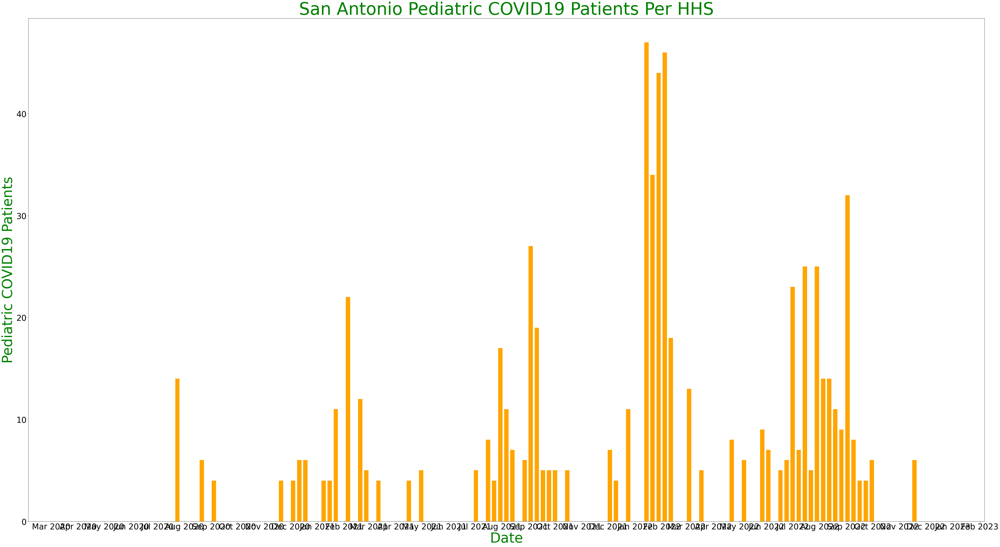

In [60]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=35)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('San Antonio Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_sa_ped.date, df_sa_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_San_Antonio_Pediatric.png')

In [61]:
aaa = df_covid_hospital[df_covid_hospital.state == 'NY']

In [62]:
date_list = aaa.collection_week.unique()
date_list.sort()
ny_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    ny_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_ny_ped = pd.DataFrame(ny_ped_list, columns = ['date', 'ped_count'])

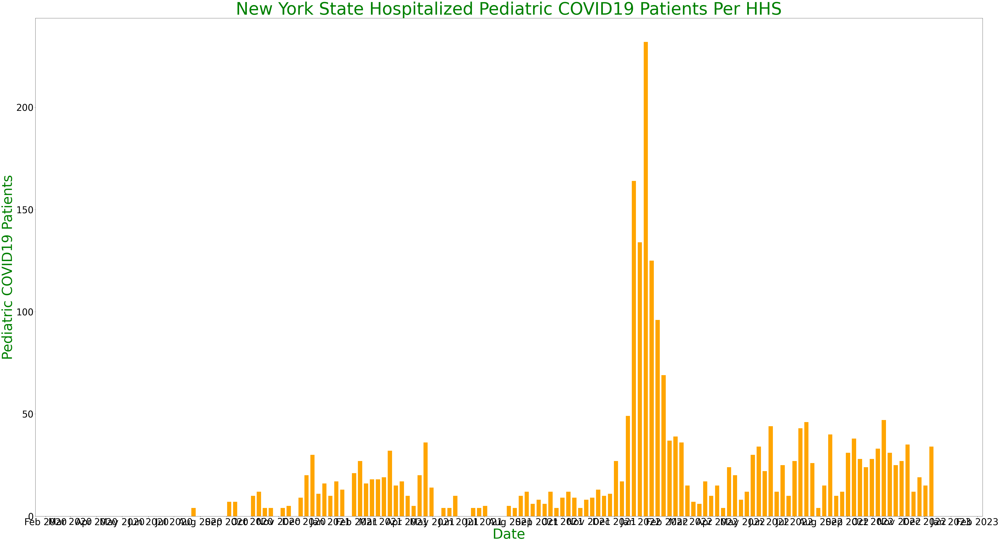

In [63]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('New York State Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_ny_ped.date, df_ny_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_NY_Pediatric.png')

In [64]:
aaa = df_covid_hospital[df_covid_hospital.state == 'TX']
date_list = aaa.collection_week.unique()
date_list.sort()
tx_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    tx_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_tx_ped = pd.DataFrame(tx_ped_list, columns = ['date', 'ped_count'])

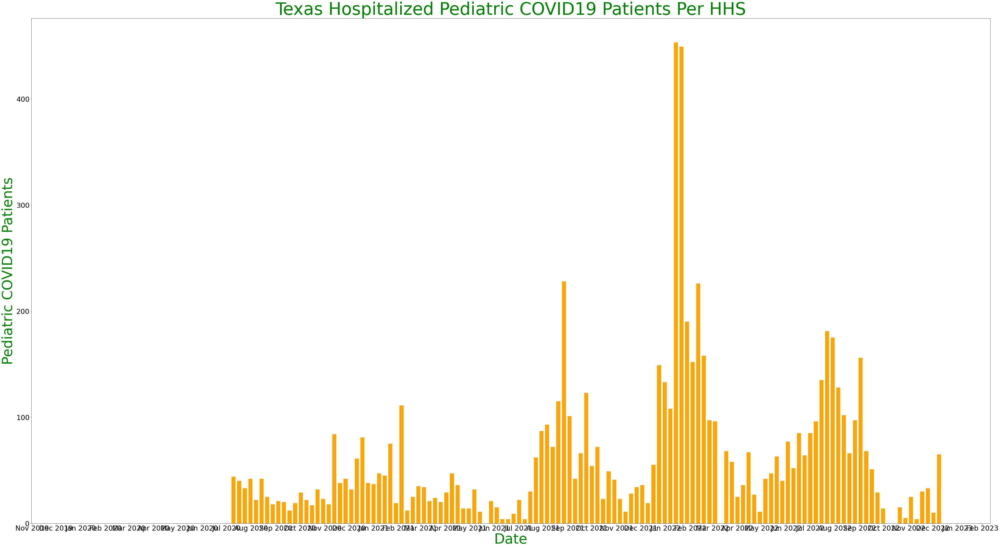

In [65]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=30)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Texas Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_tx_ped.date, df_tx_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_TX_Pediatric.png')

In [66]:
aaa = df_covid_hospital[df_covid_hospital.state == 'TX']
date_list = aaa.collection_week.unique()
date_list.sort()
tx_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    tx_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_tx_ped = pd.DataFrame(tx_ped_list, columns = ['date', 'ped_count'])

In [67]:
aaa = df_covid_hospital[df_covid_hospital.state == 'CA']
date_list = aaa.collection_week.unique()
date_list.sort()
ca_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    ca_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_ca_ped = pd.DataFrame(ca_ped_list, columns = ['date', 'ped_count'])

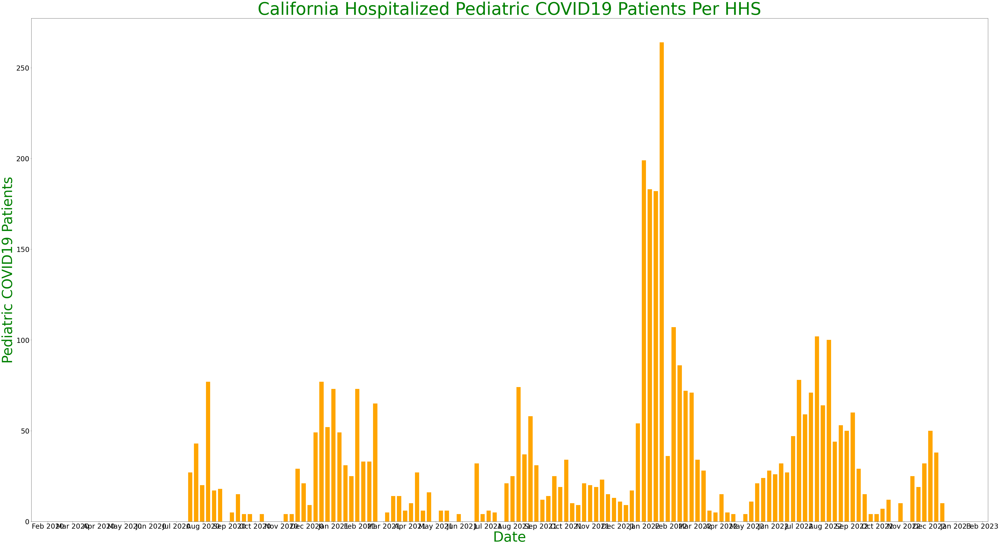

In [68]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=30)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('California Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_ca_ped.date, df_ca_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_CA_Pediatric.png')

In [69]:
aaa = df_covid_hospital
date_list = aaa.collection_week.unique()
date_list.sort()
us_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    us_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_us_ped = pd.DataFrame(us_ped_list, columns = ['date', 'ped_count'])

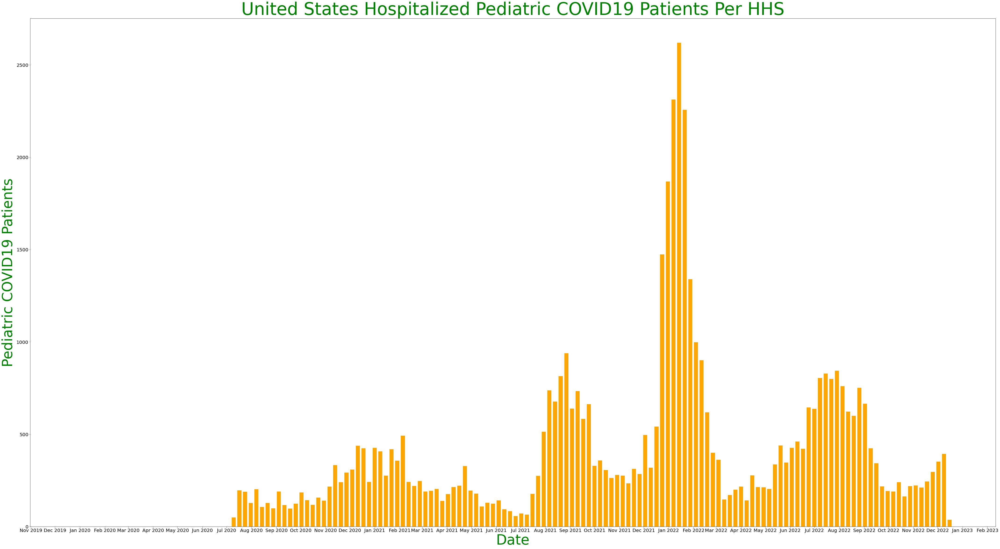

In [70]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=20)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('United States Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_us_ped.date, df_us_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_US_Pediatric.png')

In [71]:
aaa = df_covid_hospital
date_list = aaa.collection_week.unique()
date_list.sort()
us_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.all_pediatric_inpatient_bed_occupied_7_day_sum  >= 0]
    #print()
    us_ped_list.append((x, ccc.all_pediatric_inpatient_bed_occupied_7_day_sum .sum()))
df_us_ped = pd.DataFrame(us_ped_list, columns = ['date', 'ped_count'])

In [72]:
aaa = df_covid_hospital
date_list = aaa.collection_week.unique()
date_list.sort()
us_adult_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_adult_covid_confirmed_7_day_sum >= 0]
    #print()
    us_adult_list.append((x, ccc.previous_day_admission_adult_covid_confirmed_7_day_sum.sum()))
df_us_adult = pd.DataFrame(us_adult_list, columns = ['date', 'adult_count'])

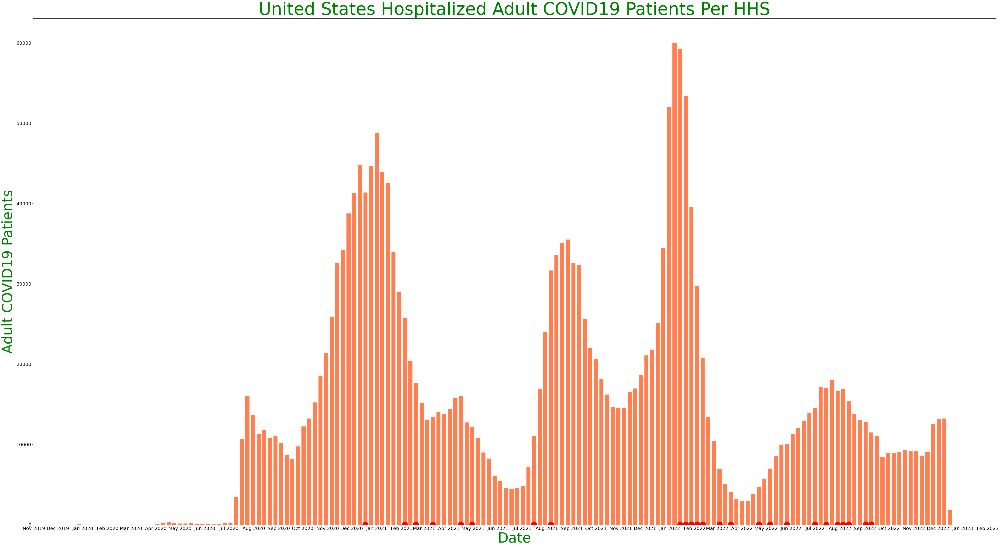

In [73]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=20)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('United States Hospitalized Adult COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Adult COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_us_adult.date, df_us_adult.adult_count, color = 'coral', width = 5)
plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_US_Adult.png')

staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_sum 

In [74]:
aaa = df_covid_hospital
date_list = aaa.collection_week.unique()
date_list.sort()
us_adult_icu_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_sum >= 0]
    #print()
    us_adult_icu_list.append((x, ccc.staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_sum.sum()))
df_us_adult_icu = pd.DataFrame(us_adult_icu_list, columns = ['date', 'adult_icu_count'])

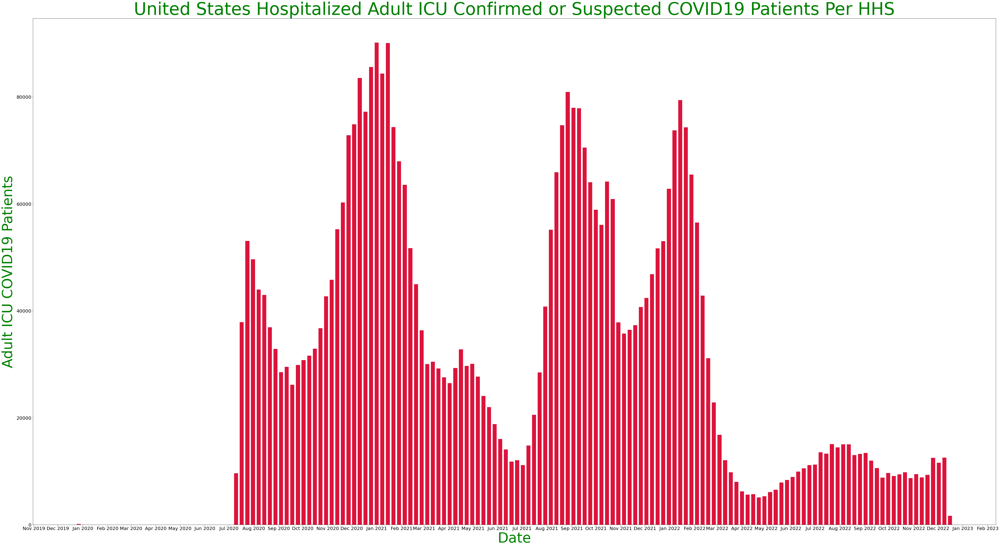

In [75]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=20)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('United States Hospitalized Adult ICU Confirmed or Suspected COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Adult ICU COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_us_adult_icu.date, df_us_adult_icu.adult_icu_count, color = 'crimson', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_US_Adult_ICU.png')

In [76]:
aaa = df_covid_hospital[df_covid_hospital.state == 'AL']
date_list = aaa.collection_week.unique()
date_list.sort()
al_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    al_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_al_ped = pd.DataFrame(al_ped_list, columns = ['date', 'ped_count'])

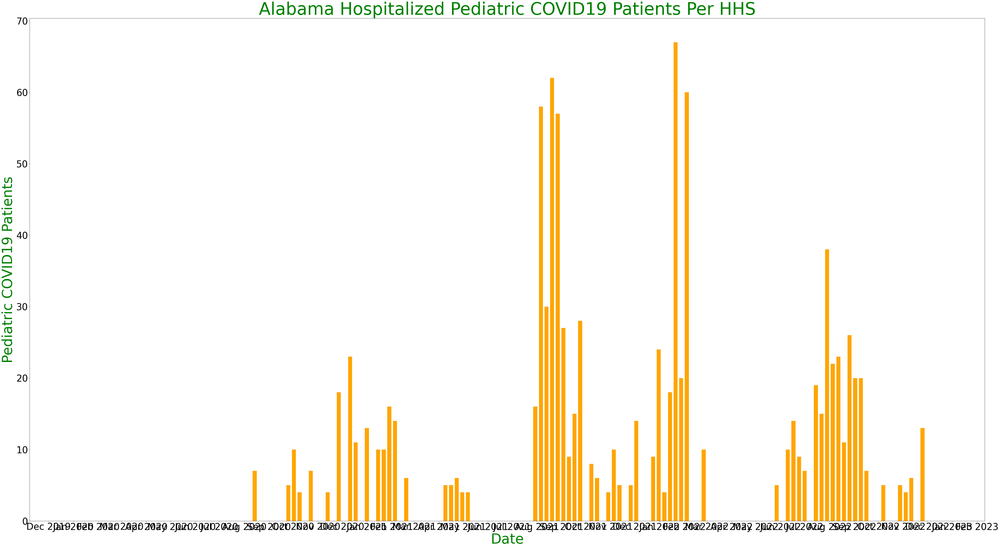

In [77]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Alabama Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_al_ped.date, df_al_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_AL_Pediatric.png')

In [78]:
aaa = df_covid_hospital[df_covid_hospital.state == 'IL']
date_list = aaa.collection_week.unique()
date_list.sort()
il_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    il_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_il_ped = pd.DataFrame(il_ped_list, columns = ['date', 'ped_count'])

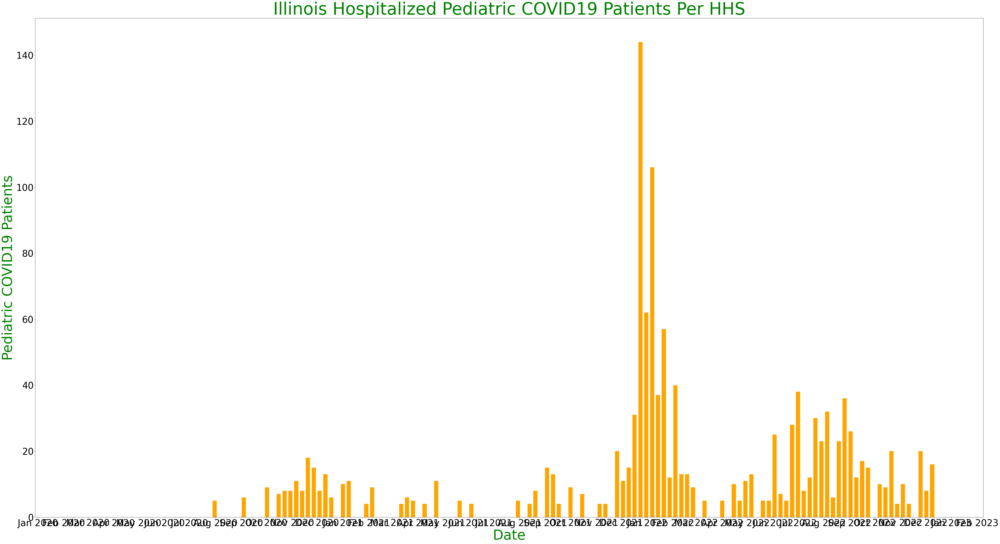

In [79]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Illinois Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_il_ped.date, df_il_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_IL_Pediatric.png')

In [80]:
aaa = df_covid_hospital[df_covid_hospital.state == 'AK']
date_list = aaa.collection_week.unique()
date_list.sort()
ak_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    ak_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_ak_ped = pd.DataFrame(ak_ped_list, columns = ['date', 'ped_count'])

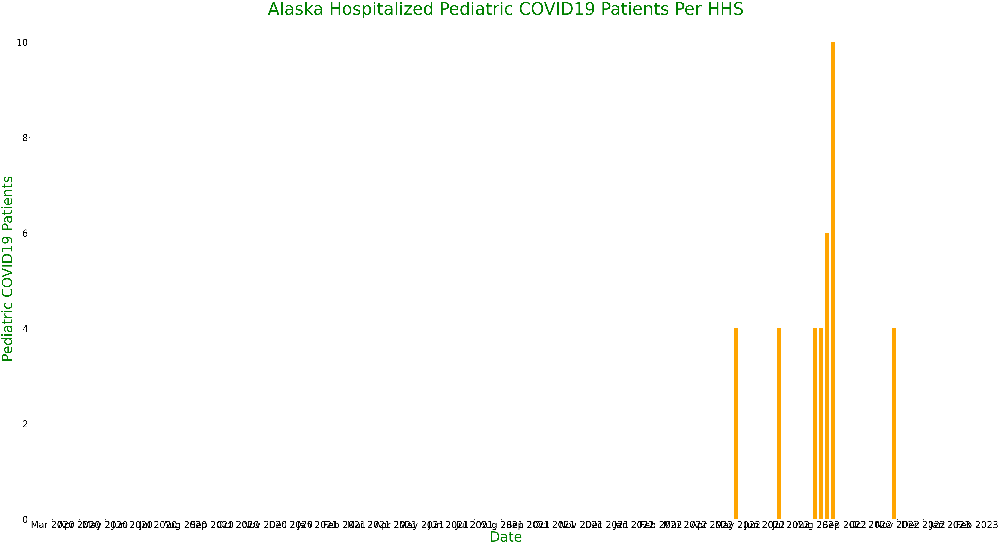

In [81]:
import datetime
import matplotlib.dates as mdates
months = mdates.MonthLocator()
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Alaska Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_ak_ped.date, df_ak_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_AK_Pediatric.png')

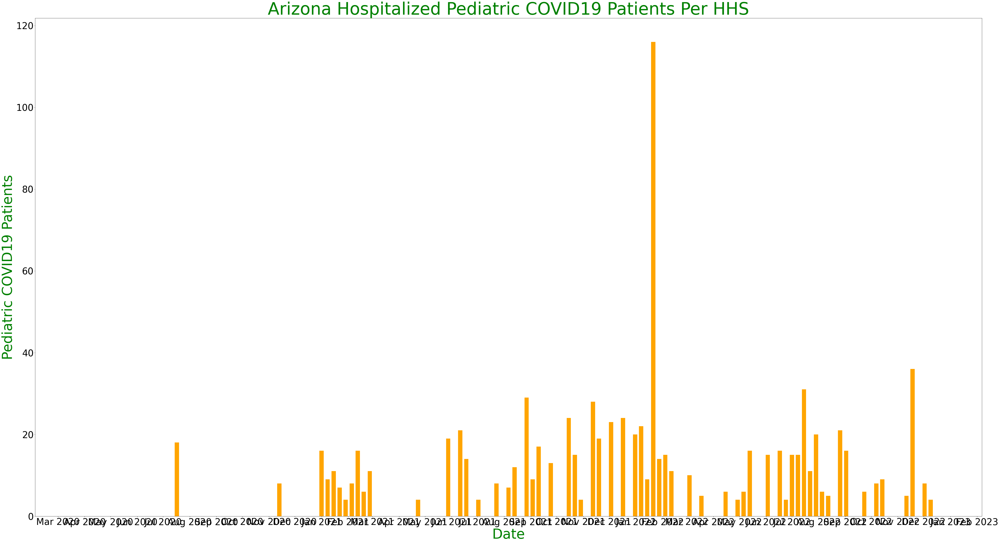

In [82]:
aaa = df_covid_hospital[df_covid_hospital.state == 'AZ']
date_list = aaa.collection_week.unique()
date_list.sort()
az_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    az_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_az_ped = pd.DataFrame(az_ped_list, columns = ['date', 'ped_count'])
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Arizona Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_az_ped.date, df_az_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_AZ_Pediatric.png')

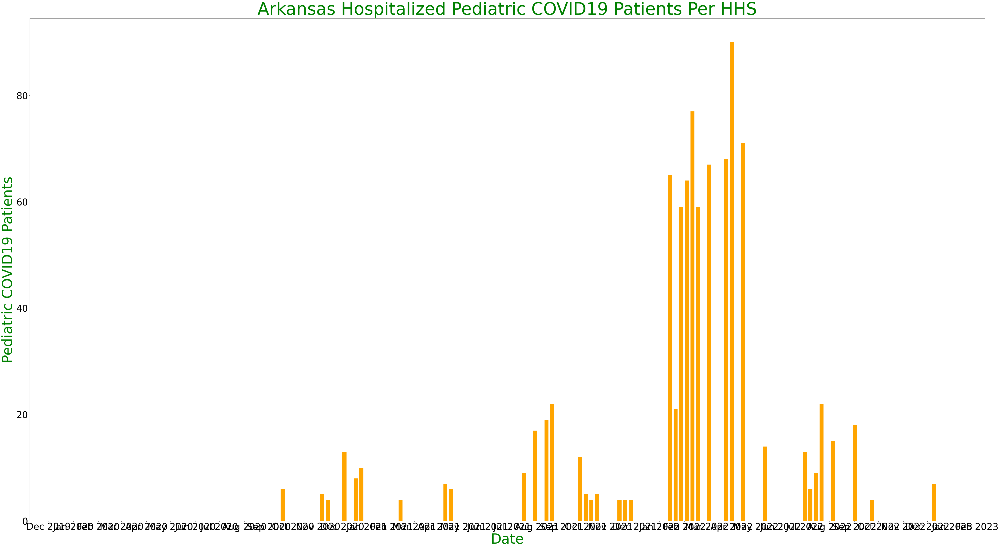

In [83]:
aaa = df_covid_hospital[df_covid_hospital.state == 'AR']
date_list = aaa.collection_week.unique()
date_list.sort()
ar_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    ar_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_ar_ped = pd.DataFrame(ar_ped_list, columns = ['date', 'ped_count'])
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=40)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Arkansas Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_ar_ped.date, df_ar_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_AR_Pediatric.png')

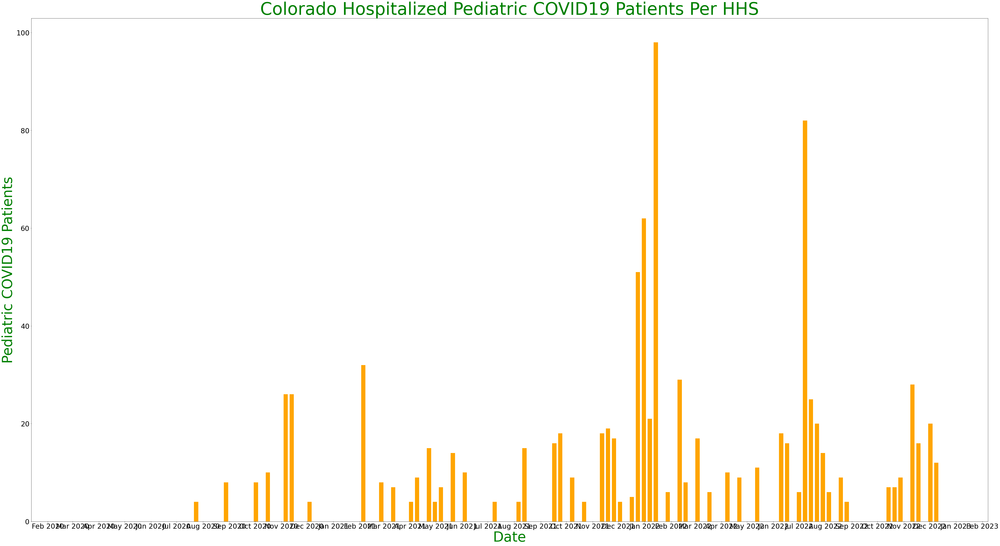

In [84]:
aaa = df_covid_hospital[df_covid_hospital.state == 'CO']
date_list = aaa.collection_week.unique()
date_list.sort()
co_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    co_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_co_ped = pd.DataFrame(co_ped_list, columns = ['date', 'ped_count'])
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=30)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Colorado Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_co_ped.date, df_co_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_CO_Pediatric.png')

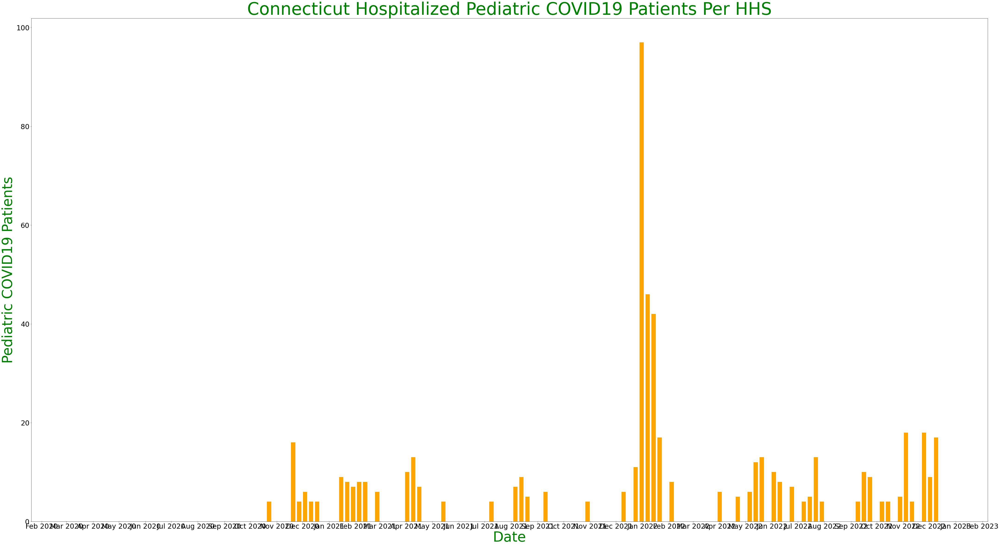

In [85]:
aaa = df_covid_hospital[df_covid_hospital.state == 'CT']
date_list = aaa.collection_week.unique()
date_list.sort()
ct_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    ct_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_ct_ped = pd.DataFrame(ct_ped_list, columns = ['date', 'ped_count'])
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=30)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Connecticut Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_ct_ped.date, df_ct_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_CT_Pediatric.png')

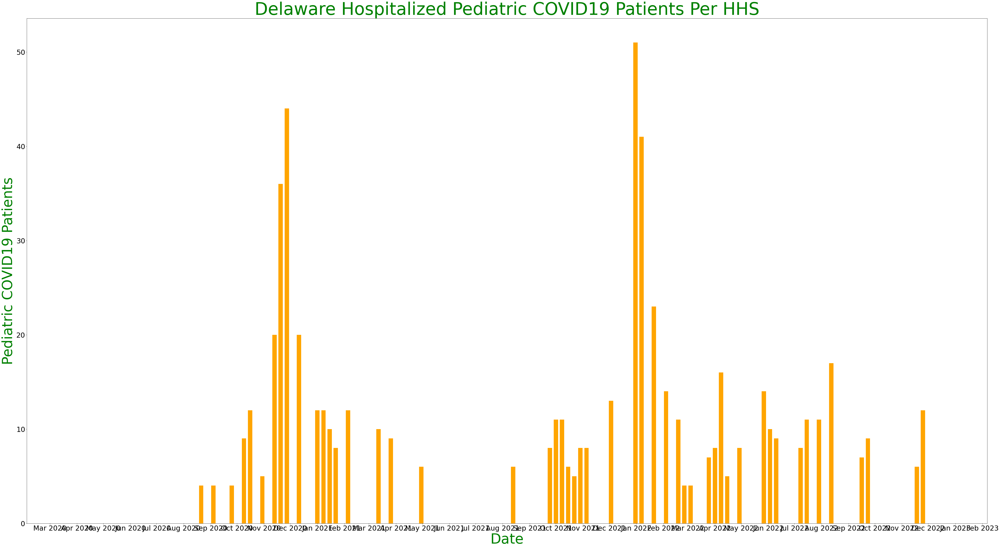

In [86]:
aaa = df_covid_hospital[df_covid_hospital.state == 'DE']
date_list = aaa.collection_week.unique()
date_list.sort()
de_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    de_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_de_ped = pd.DataFrame(de_ped_list, columns = ['date', 'ped_count'])
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=30)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Delaware Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_de_ped.date, df_de_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_DE_Pediatric.png')

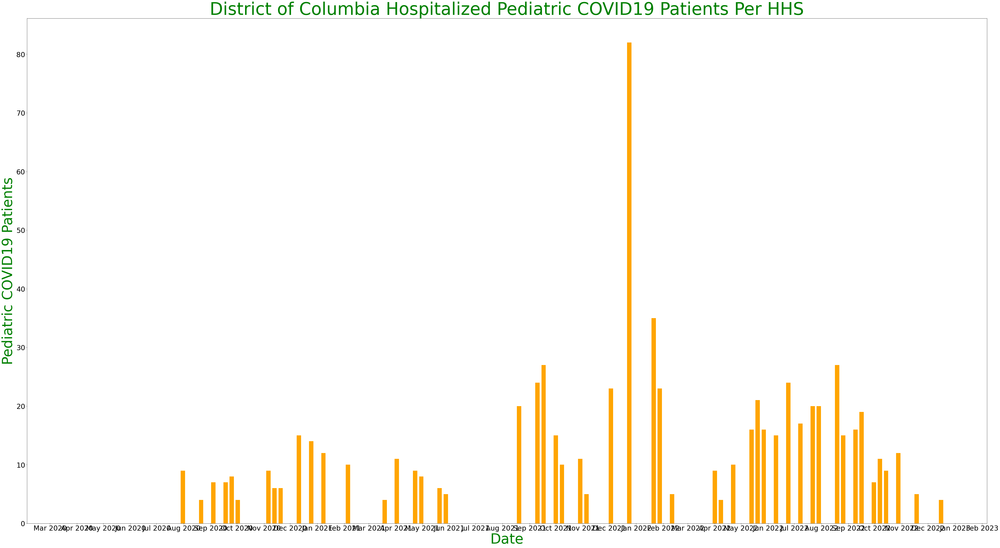

In [87]:
aaa = df_covid_hospital[df_covid_hospital.state == 'DC']
date_list = aaa.collection_week.unique()
date_list.sort()
dc_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    dc_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_dc_ped = pd.DataFrame(dc_ped_list, columns = ['date', 'ped_count'])
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=30)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('District of Columbia Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_dc_ped.date, df_dc_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_DC_Pediatric.png')

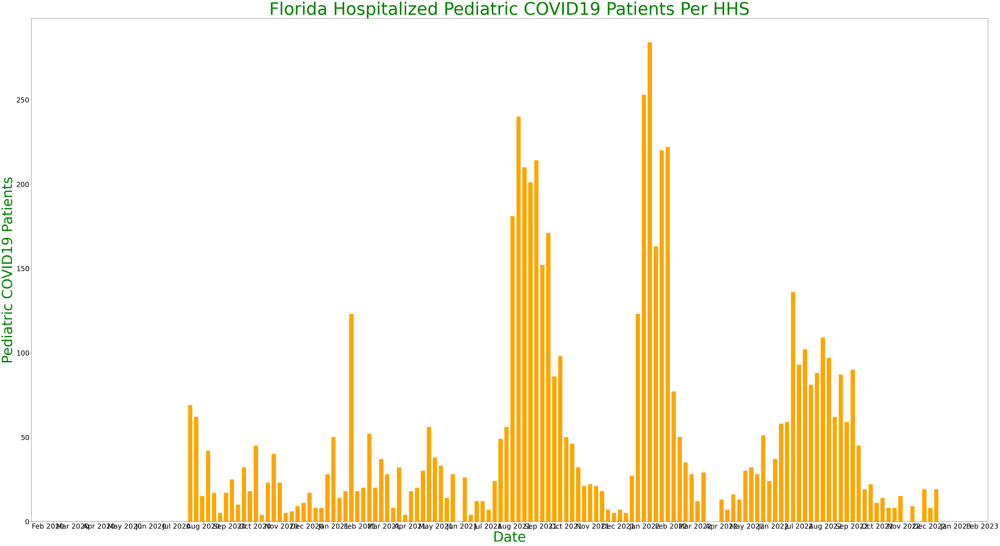

In [88]:
aaa = df_covid_hospital[df_covid_hospital.state == 'FL']
date_list = aaa.collection_week.unique()
date_list.sort()
fl_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    fl_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_fl_ped = pd.DataFrame(fl_ped_list, columns = ['date', 'ped_count'])
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=30)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Florida Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_fl_ped.date, df_fl_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_FL_Pediatric.png')

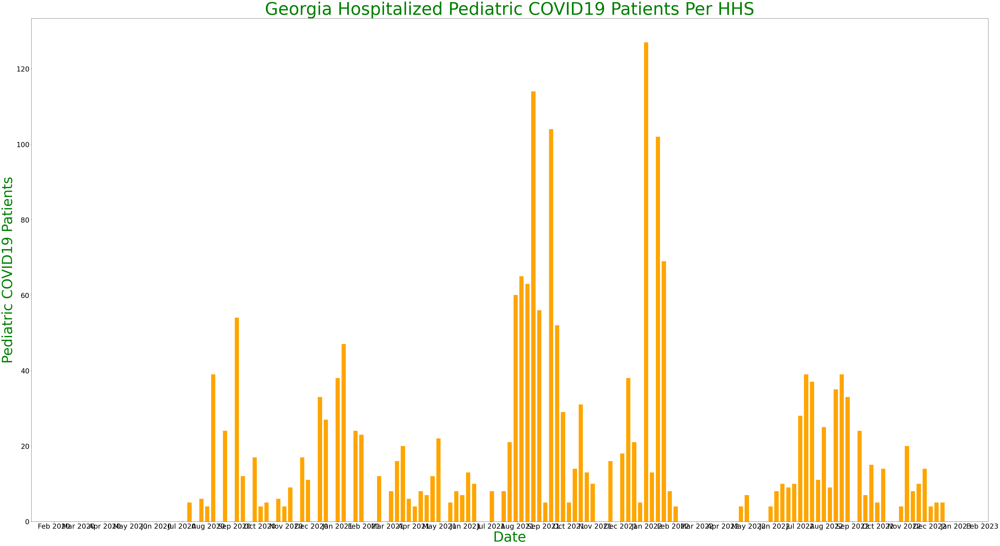

In [89]:
aaa = df_covid_hospital[df_covid_hospital.state == 'GA']
date_list = aaa.collection_week.unique()
date_list.sort()
ga_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    ga_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_ga_ped = pd.DataFrame(ga_ped_list, columns = ['date', 'ped_count'])
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=30)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Georgia Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_ga_ped.date, df_ga_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_GA_Pediatric.png')

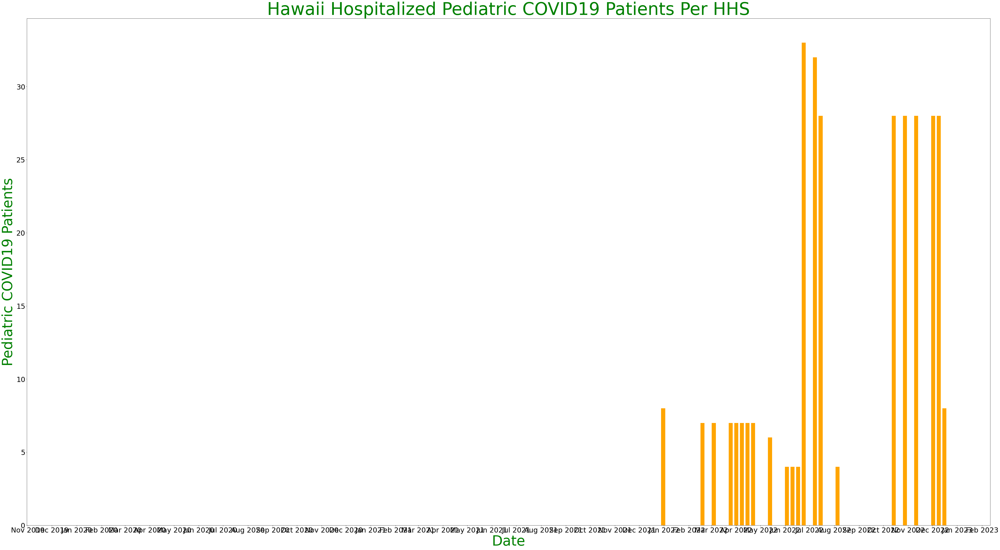

In [90]:
aaa = df_covid_hospital[df_covid_hospital.state == 'HI']
date_list = aaa.collection_week.unique()
date_list.sort()
hi_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    hi_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_hi_ped = pd.DataFrame(hi_ped_list, columns = ['date', 'ped_count'])
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=30)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Hawaii Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_hi_ped.date, df_hi_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_HI_Pediatric.png')

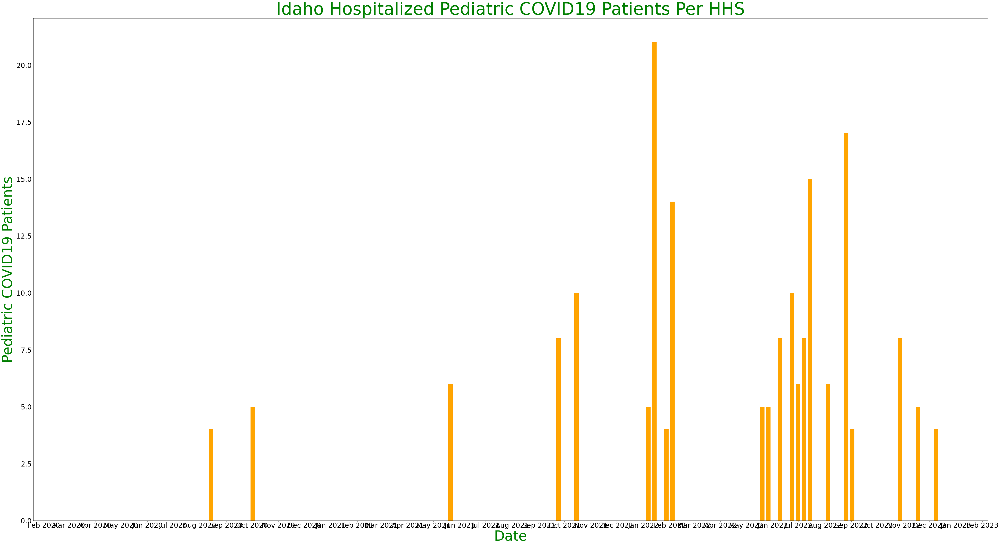

In [91]:
aaa = df_covid_hospital[df_covid_hospital.state == 'ID']
date_list = aaa.collection_week.unique()
date_list.sort()
id_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    id_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_id_ped = pd.DataFrame(id_ped_list, columns = ['date', 'ped_count'])
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=30)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Idaho Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_id_ped.date, df_id_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_ID_Pediatric.png')

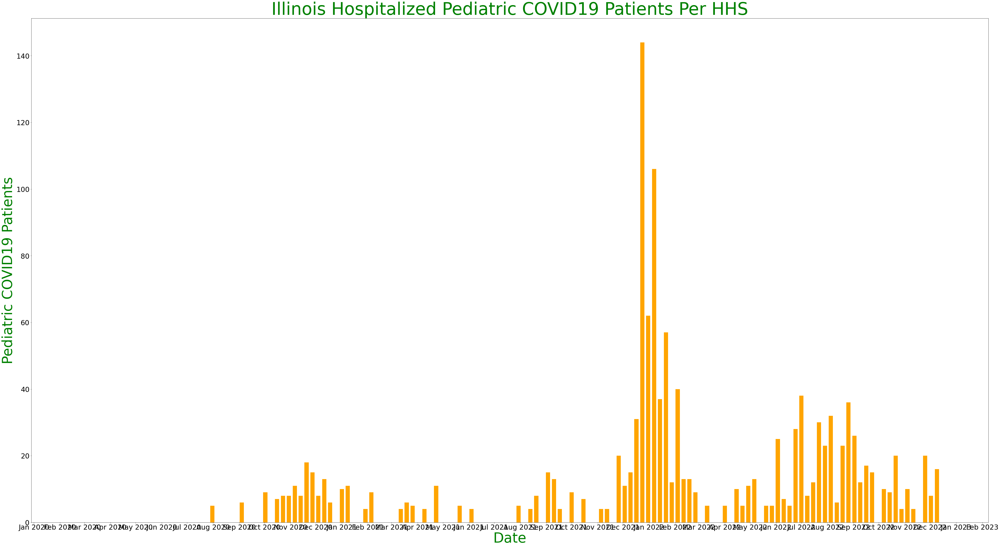

In [92]:
aaa = df_covid_hospital[df_covid_hospital.state == 'IL']
date_list = aaa.collection_week.unique()
date_list.sort()
il_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    il_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_il_ped = pd.DataFrame(il_ped_list, columns = ['date', 'ped_count'])
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=30)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Illinois Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_il_ped.date, df_il_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_IL_Pediatric.png')

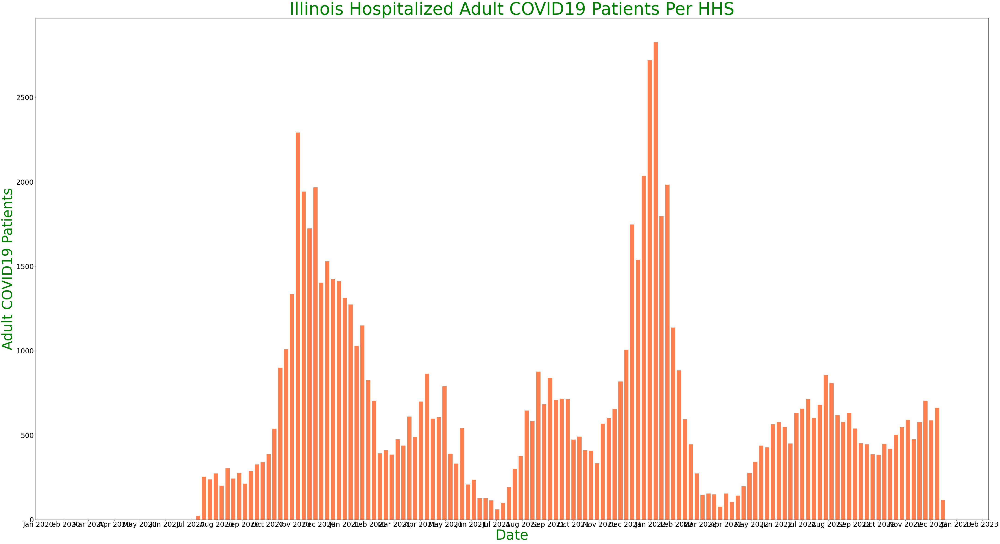

In [93]:
aaa = df_covid_hospital[df_covid_hospital.state == 'IL']
date_list = aaa.collection_week.unique()
date_list.sort()
il_adult_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_adult_covid_confirmed_7_day_sum >= 0]
    #print()
    il_adult_list.append((x, ccc.previous_day_admission_adult_covid_confirmed_7_day_sum.sum()))
df_il_adult = pd.DataFrame(il_adult_list, columns = ['date', 'ped_count'])
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=30)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('Illinois Hospitalized Adult COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Adult COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_il_adult.date, df_il_adult.ped_count, color = 'coral', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_IL_Adult.png')

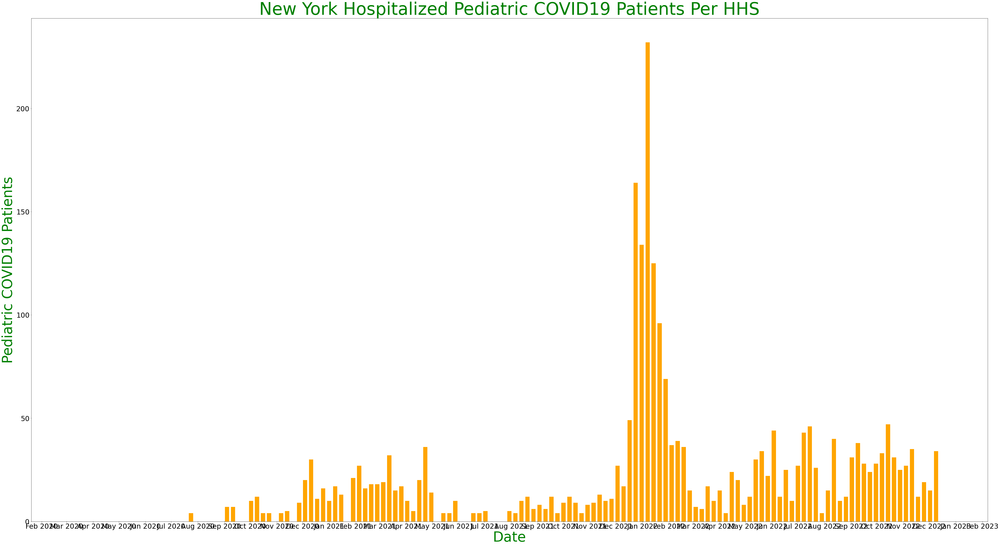

In [94]:
aaa = df_covid_hospital[df_covid_hospital.state == 'NY']
date_list = aaa.collection_week.unique()
date_list.sort()
ny_ped_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_pediatric_covid_confirmed_7_day_sum >= 0]
    #print()
    ny_ped_list.append((x, ccc.previous_day_admission_pediatric_covid_confirmed_7_day_sum.sum()))
df_ny_ped = pd.DataFrame(ny_ped_list, columns = ['date', 'ped_count'])
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=30)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('New York Hospitalized Pediatric COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_ny_ped.date, df_ny_ped.ped_count, color = 'orange', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_NY_Pediatric.png')


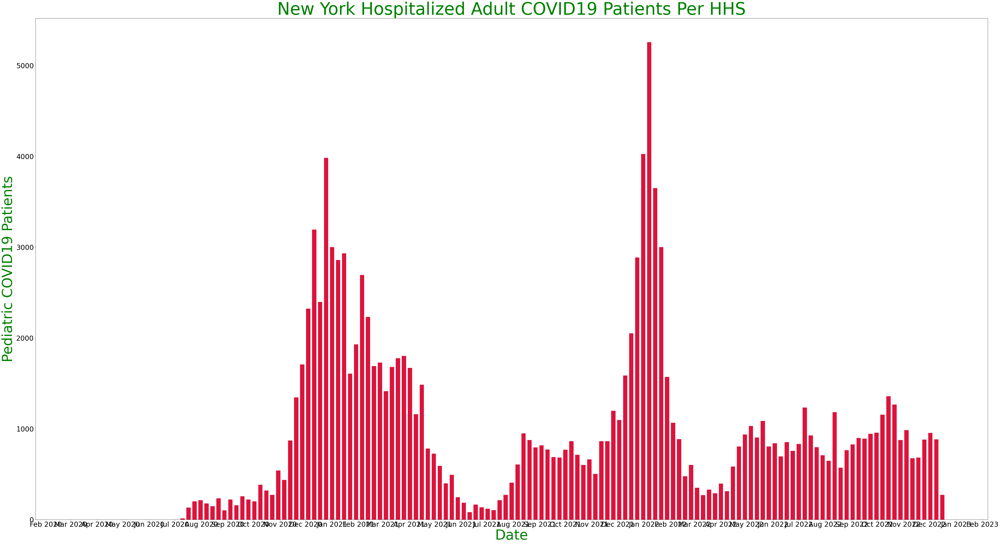

In [95]:
aaa = df_covid_hospital[df_covid_hospital.state == 'NY']
date_list = aaa.collection_week.unique()
date_list.sort()
ny_adult_list = []
for x in date_list:
    #print(x)
    bbb = aaa[aaa.collection_week == x]
    ccc = bbb[bbb.previous_day_admission_adult_covid_confirmed_7_day_sum >= 0]
    #print()
    ny_adult_list.append((x, ccc.previous_day_admission_adult_covid_confirmed_7_day_sum.sum()))
df_ny_adult = pd.DataFrame(ny_adult_list, columns = ['date', 'ped_count'])
days = mdates.DayLocator()
timeFmt = mdates.DateFormatter('%b %Y')
fig, ax = plt.subplots()
fig.set_size_inches(74,40)
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(timeFmt)
ax.tick_params(axis='both', labelsize=30)
ax.xaxis.set_minor_locator(months)
#plt.rcParams["figure.figsize"] = [17.00, 3.50]
plt.title('New York Hospitalized Adult COVID19 Patients Per HHS', color = 'green', fontsize = 74)
plt.xlabel('Date',color='green', fontsize = 60)
plt.ylabel('Pediatric COVID19 Patients',color='green', fontsize = 60)
plt.bar(df_ny_adult.date, df_ny_adult.ped_count, color = 'crimson', width = 5)
#plt.plot(ddd_rolling, 'ro',markersize = 25)
#plt.legend(['7 Day Rolling Average','Daily COVID-19 Deaths In US'], fontsize = 40)
fig.savefig('HHS_NY_Adult.png')
